# GIS Data Science Assignment: Climate Change Analysis in Tanzania

In this assignment, you will analyze climate change patterns in Tanzania using GIS data. You will work with spatial data to understand, visualize, and analyze climate trends across different regions of Tanzania.

## Setup
First, let's import the necessary libraries:

In [ ]:
# Run this cell to install any missing dependencies
#!pip install geopandas matplotlib numpy pandas seaborn folium mapclassify xarray rasterio contextily

In [1]:
# Import necessary libraries
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import os
from matplotlib.colors import ListedColormap
import contextily as ctx

# Set plotting parameters
plt.rcParams['figure.figsize'] = (12, 8)
sns.set(style="whitegrid")

## Part 1: GIS Data Basics

### Task 1.1: Load the Tanzania Shapefile
Load the Tanzania administrative boundaries shapefile and examine its structure.

In [9]:
# Hint: Use gpd.read_file() to load the shapefile
tz_shapefile = gpd.read_file("data/tza_admbnda_adm1_20181019.shp")

# Function to display basic information about a GeoDataFrame
# Function to display basic information about a GeoDataFrame
def describe_geodataframe(gdf):
    """Display basic information about a GeoDataFrame.
    
    Parameters:
    gdf (GeoDataFrame): The GeoDataFrame to describe
    
    Returns:
    dict: A dictionary containing basic information about the GeoDataFrame
    """
    info = {
        'crs': gdf.crs,  # Get the coordinate reference system
        'geometry_type': gdf.geometry.geom_type.unique(),  # Get the geometry type
        'num_features': len(gdf),  # Get the number of features
        'attributes': gdf.columns.tolist(),  # Get the attribute column names
        'total_area': gdf.to_crs(epsg=3857).geometry.area.sum() / 1000000,  # Calculate total area in sq km
        'bounds': gdf.total_bounds  # Get the bounds of the dataset (minx, miny, maxx, maxy)
    }
    return info

# Call the function with your loaded shapefile
tz_info = describe_geodataframe(tz_shapefile)
# tz_shapefile.geometry

### Task 1.2: Understand Coordinate Reference Systems
Explain the current CRS and reproject the data to a suitable projection for Tanzania.

In [10]:
# TODO: Identify the current CRS and explain why it might not be optimal for Tanzania
current_crs = tz_shapefile.crs
current_crs


<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The EPSG:4326 Coordinate Reference System may not be ideal if we are using it to calculate area, as it uses degrees. A projected reference system uses meters and is more suitable for area calculation.

In [11]:

# TODO: Reproject the data to a more appropriate CRS for Tanzania
# Hint: Consider using EPSG:21037 (Arc 1960 / UTM zone 37S) which is suitable for Tanzania
tz_projected = tz_shapefile.to_crs(epsg=21037)
print(tz_projected.geometry.head())

def percentage_difference(v1, v2):
    """
    Calculate the percentage difference between two values.

    :param v1: First value
    :param v2: Second value
    :return: Percentage difference
    """
    # Calculate the absolute difference
    absolute_difference = abs(v1 - v2)
    
    # Calculate the average of the two values
    average = (v1 + v2) / 2
    
    # Calculate the percentage difference
    percent_diff = (absolute_difference / average) * 100    
    return percent_diff


# TODO: Compare the original and reprojected data
# Hint: Create a function that compares areas before and after reprojection
def compare_projections(original_gdf, reprojected_gdf):
    """Compare the original and reprojected GeoDataFrames.
    
    Parameters:
    original_gdf (GeoDataFrame): The original GeoDataFrame
    reprojected_gdf (GeoDataFrame): The reprojected GeoDataFrame
    
    Returns:
    dict: A dictionary containing comparison metrics
    """
    comparison = {
        'original_crs': original_gdf.crs ,  # TODO: Get the original CRS
        'new_crs': reprojected_gdf.crs,  # TODO: Get the new CRS
        'original_area': original_gdf.to_crs(epsg=3857).geometry.area.sum() / 1000000,  # TODO: Calculate the total area in the original projection
        'new_area': reprojected_gdf.to_crs(epsg=3857).geometry.area.sum() / 1000000,  # TODO: Calculate the total area in the new projection
        'percent_difference': percentage_difference(reprojected_gdf.to_crs(epsg=3857).geometry.area.sum() / 1000000,original_gdf.to_crs(epsg=3857).geometry.area.sum() / 1000000)  # TODO: Calculate the percentage difference in area
    }
    return comparison

# Call the comparison function
projection_comparison = compare_projections(tz_shapefile, tz_projected)
projection_comparison
# type of tz_projected
isinstance(tz_projected, gpd.GeoDataFrame)

0    POLYGON ((90376.328 9809845.87, 98487.301 9805...
1    MULTIPOLYGON (((529755.957 9259900.21, 529454....
2    MULTIPOLYGON (((128523.936 9499786.244, 128520...
3    MULTIPOLYGON (((-300646.915 9699556.095, -3007...
4    POLYGON ((50413.053 9236923.055, 50720.006 923...
Name: geometry, dtype: geometry


True

## Part 2: Data Loading and Processing

### Task 2.1: Load Climate Data
Load the provided climate data for Tanzania and examine its structure.

In [12]:
# TODO: Load the climate data CSV file
climate_data = pd.read_csv("data/tanzania_monthly_climate_data.csv")

# TODO: Display the first few rows and basic statistics of the climate data
# Hint: Use .head(), .describe(), and .info() methods
print(climate_data.head())
print(climate_data.describe())
print(climate_data.info())

# TODO: Check for missing values and handle them appropriately
def check_missing_values(df):
    """Check for missing values in a DataFrame and return a summary.
    
    Parameters:
    df (DataFrame): The DataFrame to check
    
    Returns:
    DataFrame: A summary of missing values by column
    """
    missing_df = df.isnull().sum().reset_index()
    missing_df.columns = ['Column', 'Missing Values']
    return missing_df

missing_summary = check_missing_values(climate_data)

  REGION_CODE REGION_NAME  YEAR  MONTH      ZONE  AVG_TEMP_C  MAX_TEMP_C  \
0          AR      Arusha  2000      1  Northern       22.91       25.50   
1          AR      Arusha  2000      2  Northern       23.11       25.57   
2          AR      Arusha  2000      3  Northern       22.61       25.19   
3          AR      Arusha  2000      4  Northern       21.91       24.96   
4          AR      Arusha  2000      5  Northern       20.91       24.17   

   MIN_TEMP_C  TEMP_RANGE_C  PRECIPITATION_MM  RAIN_DAYS  HEAVY_RAIN_DAYS  \
0       20.31          5.19             696.7         13                0   
1       21.08          4.48             611.9          8                2   
2       18.69          6.49            1036.1         14                2   
3       18.65          6.31            1290.6         25                9   
4       17.64          6.52             866.4         13                3   

   DROUGHT_INDEX  ELEVATION_M  DISTANCE_TO_COAST_KM  
0           0.16        92

### Task 2.2: Join Climate Data with Spatial Data
Merge the climate data with the Tanzania shapefile based on a common identifier.

In [13]:
# TODO: Identify the common field between the climate data and the shapefile
# Hint: Look for a region/district identifier in both datasets
# Find common columns in tz_shapefile and climate_data
common_columns = set(tz_shapefile.columns).intersection(set(climate_data.columns))
print(tz_shapefile.head())
print(climate_data.columns)

# TODO: Join the climate data with the shapefile, returning a new GeoDataFrame
# Hint: Use the merge() or join() method
tz_climate = gpd.GeoDataFrame(pd.merge(climate_data,tz_projected, left_on='REGION_NAME', right_on='ADM1_EN', how='left'))

print(tz_climate.crs)

# TODO: Verify the join was successful by checking the shape and contents of the result
def verify_join(original_gdf, joined_gdf, climate_df):
    """Verify that the join between spatial and climate data was successful.
    
    Parameters:
    original_gdf (GeoDataFrame): The original spatial GeoDataFrame
    joined_gdf (GeoDataFrame): The joined GeoDataFrame
    climate_df (DataFrame): The climate DataFrame
    
    Returns:
    dict: A dictionary containing verification metrics
    """
    verification = {
        'original_features': len(original_gdf),  # TODO: Get the number of features in the original GeoDataFrame
        'joined_features': len(joined_gdf),  # TODO: Get the number of features in the joined GeoDataFrame
        'climate_records': len(climate_df),  # TODO: Get the number of records in the climate DataFrame
        'joined_columns': joined_gdf.columns.tolist(),  # TODO: Get the column names in the joined GeoDataFrame
        'is_successful': len(joined_gdf.columns.tolist()) != len(original_gdf.columns.tolist()) # TODO: Determine if the join was successful
    }
    return verification

join_verification = verify_join(tz_shapefile, tz_climate, climate_data)

                       ADM0_EN                          ADM0_SW ADM0_PCODE  \
0  United Republic of Tanzania  Jamhuri ya Muungano wa Tanzania         TZ   
1  United Republic of Tanzania  Jamhuri ya Muungano wa Tanzania         TZ   
2  United Republic of Tanzania  Jamhuri ya Muungano wa Tanzania         TZ   
3  United Republic of Tanzania  Jamhuri ya Muungano wa Tanzania         TZ   
4  United Republic of Tanzania  Jamhuri ya Muungano wa Tanzania         TZ   

         ADM1_EN ADM1_PCODE                                           geometry  
0         Arusha       TZ02  POLYGON ((35.32059 -1.71952, 35.39328 -1.76093...  
1  Dar-es-salaam       TZ07  MULTIPOLYGON (((39.27007 -6.6983, 39.26734 -6....  
2         Dodoma       TZ01  MULTIPOLYGON (((35.65407 -4.52047, 35.65403 -4...  
3          Geita       TZ25  MULTIPOLYGON (((31.81659 -2.69949, 31.8154 -2....  
4         Iringa       TZ11  POLYGON ((34.93466 -6.88891, 34.93743 -6.88938...  
Index(['REGION_CODE', 'REGION_NAME', 'YEAR', 

## Part 3: Data Visualization

### Task 3.1: Create a Choropleth Map
Create a choropleth map showing average temperature across Tanzania regions.

Data is already in EPSG:21037


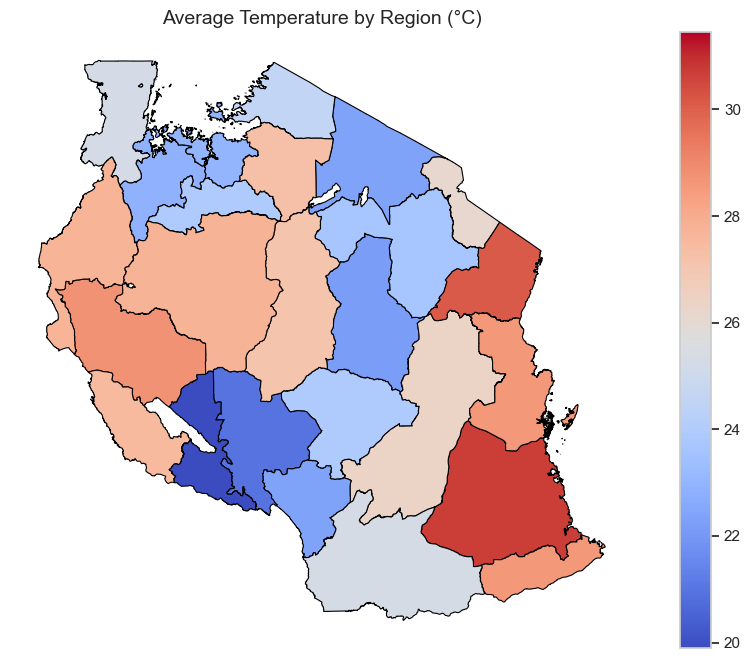

1728

In [ ]:
# TODO: Create a choropleth map of average temperature by region

# Hint: Use the .plot() method with the column parameter
def create_choropleth(gdf, title, cmap='coolwarm', figsize=(12, 8)):
    """Create a choropleth map for a GeoDataFrame.
    
    Parameters:
    gdf (GeoDataFrame): The GeoDataFrame to plot
    column (str): The column to use for coloring
    title (str): The title of the map
    cmap (str or Colormap): The colormap to use
    figsize (tuple): The figure size
    
    Returns:
    matplotlib.figure.Figure: The created figure
    """
    # Step 1: Ensure the GeoDataFrame is in the correct CRS
    if gdf.crs != 'EPSG:21037':
        print("Reprojecting data to EPSG:21037...")
        gdf = gdf.to_crs(epsg=21037)
    else:
        print("Data is already in EPSG:21037")

    # Step 2: Group by REGION_NAME to calculate average temperature per region
    region_avg_temp = gdf.groupby('REGION_NAME', as_index=False)['AVG_TEMP_C'].mean()

    # Step 3: Merge the averaged data back into the GeoDataFrame **without losing geometries**
    gdf = gdf.merge(region_avg_temp, on='REGION_NAME', suffixes=('', '_avg'))
    # print(gdf.head(10))
    # remove duplicate rows
    gdf = gdf.drop_duplicates(subset=['REGION_NAME'])
    # print(gdf.head(10))


    # Step 4: Plot the choropleth map
    fig, ax = plt.subplots(figsize=figsize)
    gdf.plot(column='AVG_TEMP_C_avg', cmap=cmap, linewidth=0.8, edgecolor='black', legend=True, ax=ax)

    # Step 5: Add title and clean up the plot
    ax.set_title(title, fontsize=14)
    ax.set_axis_off()

    return fig


# Call the function
temp_map = create_choropleth(
    tz_climate,
    title='Average Temperature by Region (°C)'
)

# Show the map
plt.show()

# Verify missing geometries
tz_climate.geometry.isna().sum()


### Task 3.2: Create a Time Series Visualization
Create a time series visualization showing temperature trends over time for selected regions.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96 entries, 0 to 95
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   index        96 non-null     int64  
 1   REGION_NAME  96 non-null     object 
 2   YEAR         96 non-null     int64  
 3   AVG_TEMP_C   96 non-null     float64
dtypes: float64(1), int64(2), object(1)
memory usage: 3.1+ KB
None


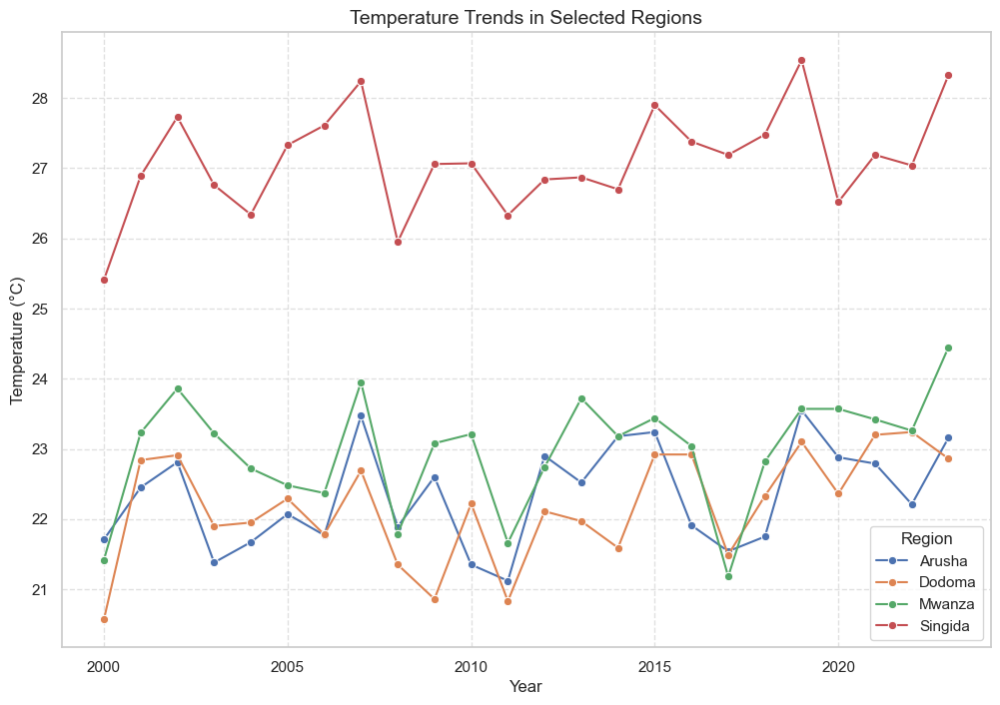

In [15]:
# TODO: Select a few representative regions for the time series
# Hint: Choose regions from different parts of the country
# filter yearly_temp_data for selected regions
# TODO: Filter the climate data for these regions
# region_climate_data = tz_climate.groupby(['REGION_NAME', 'YEAR']).mean(numeric_only=True).reset_index()
# region_climate_data = region_climate_data[region_climate_data['REGION_NAME'].isin(selected_regions)]
# TODO: Create a time series plot of temperature trends
def plot_time_series(df, regions, time_column, value_column, title, figsize=(12, 8)):
    """Create a time series plot for selected regions.
    
    Parameters:
    df (DataFrame): The DataFrame containing the time series data
    regions (list): The list of regions to include
    time_column (str): The column containing time information
    value_column (str): The column containing the values to plot
    title (str): The title of the plot
    figsize (tuple): The figure size
    
    Returns:
    matplotlib.figure.Figure: The created figure
    """
    # TODO: Implement this function
    yearly_temp_data=df.groupby(['REGION_NAME','YEAR'])['AVG_TEMP_C'].mean().reset_index()
    selected_temp_data = yearly_temp_data[yearly_temp_data['REGION_NAME'].isin(regions)].reset_index()
    print(selected_temp_data.info())
     # Sort for correct time progression
    selected_temp_data = selected_temp_data.sort_values(by=[time_column, 'REGION_NAME'])
    # Create the figure
    fig, ax = plt.subplots(figsize=figsize)

    # Plot temperature trends for each region
    sns.lineplot(data=selected_temp_data, x=time_column, y=value_column, hue='REGION_NAME', marker="o", ax=ax)

    # Format the plot
    ax.set_title(title, fontsize=14)
    ax.set_xlabel("Year", fontsize=12)
    ax.set_ylabel("Temperature (°C)", fontsize=12)
    ax.legend(title="Region")
    ax.grid(True, linestyle='--', alpha=0.6)

    return fig

temp_time_series = plot_time_series(climate_data, ['Arusha','Dodoma','Mwanza','Singida','Dar-es-salaam'], 'YEAR', 'AVG_TEMP_C', "Temperature Trends in Selected Regions")

### Task 3.3: Create an Interactive Map
Create an interactive map showing climate data using Folium.

In [16]:
# TODO: Create an interactive map using Folium
def create_interactive_map(gdf, column, popup_columns, title, center=None, zoom_start=6):
    """Create an interactive map using Folium.
    
    Parameters:
    gdf (GeoDataFrame): The GeoDataFrame to map (must be in WGS84)
    column (str): The column to use for coloring
    popup_columns (list): Columns to include in the popup
    title (str): The title of the map
    center (tuple): The center coordinates [lat, lon]
    zoom_start (int): The initial zoom level
    
    Returns:
    folium.Map: The created interactive map
    """
    # Step 1: Ensure the dataset is in WGS84 before mapping
    if gdf.crs is None or gdf.crs.to_string() != "EPSG:4326":
        gdf = gdf.to_crs(epsg=4326)

    # Step 2: Compute region-wise averages for climate data
    climate_agg = gdf.groupby("REGION_NAME").mean(numeric_only=True).reset_index()

    # Step 3: Merge the aggregated data back with geometries
    region_climate_data = gdf.drop_duplicates(subset=["REGION_NAME"]).merge(
        climate_agg, on="REGION_NAME", suffixes=("", "_mean")
    )

    # Step 4: Use the first region's coordinates as the map center 
    first_region = region_climate_data.iloc[0].geometry.representative_point()
    center = [first_region.y, first_region.x]

    # Step 5: Create the Folium map
    m = folium.Map(location=center, zoom_start=zoom_start, control_scale=True)

    # Convert the GeoDataFrame to GeoJSON for Folium
    geojson_data = region_climate_data.to_json()

    # Step 6: Create a Choropleth layer
    folium.Choropleth(
        geo_data=geojson_data,
        name="Choropleth",
        data=region_climate_data,
        columns=["REGION_NAME", column],
        key_on="feature.properties.REGION_NAME",
        fill_color="YlGnBu",
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=column
    ).add_to(m)

    # Step 7: Add popups with selected climate attributes
    for _, row in region_climate_data.iterrows():
        # Define tooltip content (including REGION_NAME and PRECIPITATION_MM)
        tooltip_text = (
            f"<b>REGION:</b> {row['REGION_NAME']}<br>"
            f"<b>PRECIPITATION (mm):</b> {row['PRECIPITATION_MM']}<br>"
            + "<br>".join([f"<b>{col}:</b> {row[col]}" for col in popup_columns if col in row])
        )

        # Define popup content
        popup_text = "<br>".join([f"<b>{col}:</b> {row[col]}" for col in popup_columns if col in row])

        folium.GeoJson(
            row.geometry,
            name=row["REGION_NAME"],
            tooltip=tooltip_text,  # Updated tooltip with REGION_NAME & PRECIPITATION_MM
            popup=folium.Popup(popup_text, max_width=300)
        ).add_to(m)

    return m

tz_climate = tz_climate[tz_climate.geometry.notna()]
print(tz_climate.columns)
# Call the function to create the interactive map
interactive_map = create_interactive_map(
    tz_climate,
    column="PRECIPITATION_MM",
    popup_columns=["REGION","AVG_TEMP_C", "RAIN_DAYS", "HEAVY_RAIN_DAYS", "DROUGHT_INDEX", "ELEVATION_M", "DISTANCE_TO_COAST_KM"],
    title="Climate Data by Region"
)

# Display the map
interactive_map

Index(['REGION_CODE', 'REGION_NAME', 'YEAR', 'MONTH', 'ZONE', 'AVG_TEMP_C',
       'MAX_TEMP_C', 'MIN_TEMP_C', 'TEMP_RANGE_C', 'PRECIPITATION_MM',
       'RAIN_DAYS', 'HEAVY_RAIN_DAYS', 'DROUGHT_INDEX', 'ELEVATION_M',
       'DISTANCE_TO_COAST_KM', 'ADM0_EN', 'ADM0_SW', 'ADM0_PCODE', 'ADM1_EN',
       'ADM1_PCODE', 'geometry'],
      dtype='object')


## Part 4: Climate Change EDA

### Task 4.1: Analyze Temperature Trends
Analyze the trends in temperature across Tanzania over time.

Top 5 annual temp increase rates (largest slopes):
   REGION_NAME     slope   intercept       p_value  r_squared
12    Morogoro  0.074822 -124.146845  1.435131e-11   0.147676
24       Tanga  0.070465 -111.648701  5.131414e-11   0.140197
13      Mtwara  0.069161 -110.520006  1.738329e-09   0.119228
8        Lindi  0.068304 -106.694196  1.400714e-09   0.120526
5       Katavi  0.059143  -90.209190  3.300131e-08   0.101391

Top 5 annual temp decrease rates (smallest slopes):
   REGION_NAME     slope  intercept   p_value  r_squared
4       Kagera -0.001687  28.665813  0.871769   0.000091
2        Geita  0.033204 -43.908462  0.001777   0.033631
14      Mwanza  0.034113 -45.644220  0.002169   0.032392
0       Arusha  0.034148 -46.358352  0.001356   0.035314
15      Njombe  0.034704 -47.474462  0.003646   0.029171


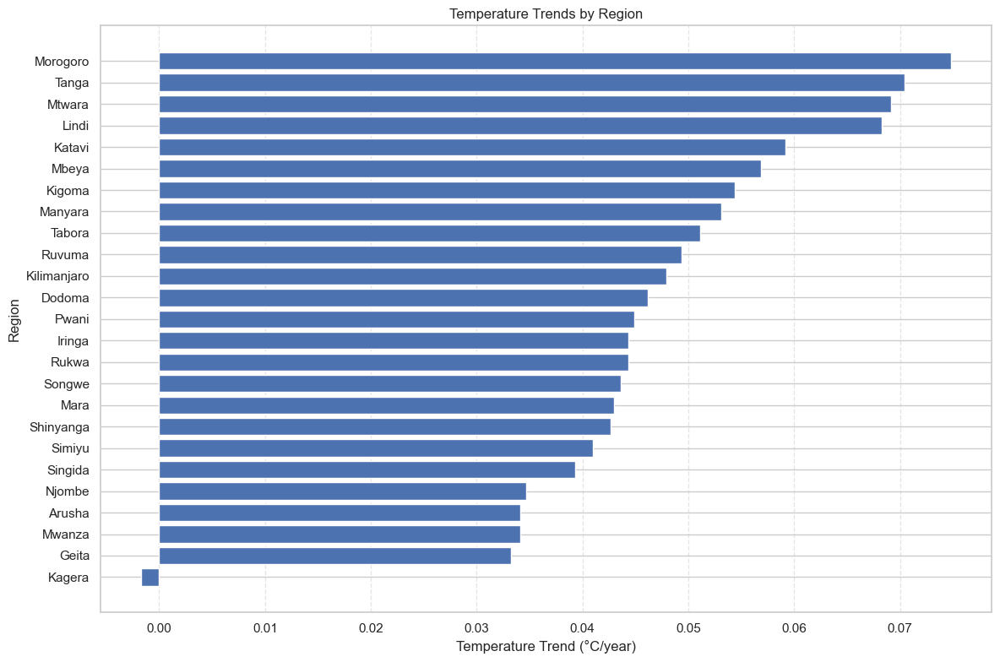

In [50]:
# TODO: Calculate temperature trends for each region
import statsmodels.api as sm

def calculate_temperature_trends(df, region_column, year_column, temp_column):
    """Calculate temperature trends for each region.
    
    Parameters:
    df (DataFrame): The DataFrame containing climate data
    region_column (str): The column containing region identifiers
    year_column (str): The column containing year information
    temp_column (str): The column containing temperature values
    
    Returns:
    DataFrame: A DataFrame containing trend information for each region
    """
    # TODO: Implement this function using linear regression or other trend analysis methods
    # Drop any rows with missing data in the relevant columns
    df = df.dropna(subset=[region_column, year_column, temp_column])
    
    results = []
    
    # Group by region
    for region, group in df.groupby(region_column):
        # X is the predictor (Year), y is the response (Temperature)
        X = group[year_column].values
        y = group[temp_column].values
        
        # Add a constant to X for the intercept in OLS
        X = sm.add_constant(X)
        
        # Fit the OLS regression
        model = sm.OLS(y, X).fit()
        
        # Extract regression metrics
        intercept = model.params[0]
        slope     = model.params[1]
        p_value   = model.pvalues[1]  # p-value for the slope
        r_squared = model.rsquared
        
        results.append({
            region_column: region,
            "slope": slope,
            "intercept": intercept,
            "p_value": p_value,
            "r_squared": r_squared
        })
        
    # Convert results into a DataFrame and order by slope
    trends_df = pd.DataFrame(results).sort_values("slope", ascending=False)
    return trends_df

temp_trends = calculate_temperature_trends(tz_climate, 'REGION_NAME', 'YEAR', 'AVG_TEMP_C')
print("Top 5 annual temp increase rates (largest slopes):")
top_increases = temp_trends.nlargest(5, "slope")
print(top_increases)

print("\nTop 5 annual temp decrease rates (smallest slopes):")
top_decreases = temp_trends.nsmallest(5, "slope")
print(top_decreases)

# TODO: Visualize the temperature trends
def plot_temperature_trends(trends_df, region_column, trend_column, title, figsize=(12, 8)):
    """Plot temperature trends by region.
    
    Parameters:
    trends_df (DataFrame): The DataFrame containing trend information
    region_column (str): The column containing region identifiers
    trend_column (str): The column containing trend values
    title (str): The title of the plot
    figsize (tuple): The figure size
    
    Returns:
    matplotlib.figure.Figure: The created figure
    """
    # Sort by the trend column (descending by default)
    trends_sorted = trends_df.sort_values(by=trend_column, ascending=False)
    
    # Extract data for plotting
    regions = trends_sorted[region_column]
    trends = trends_sorted[trend_column]
    
    # Create the figure and axes
    fig, ax = plt.subplots(figsize=figsize)
    
    # Create a horizontal bar chart
    ax.barh(regions, trends)
    
    # Invert y-axis so the highest values are at the top
    ax.invert_yaxis()
    
    # Label axes and set title
    ax.set_xlabel("Temperature Trend (°C/year)")
    ax.set_ylabel("Region")
    ax.set_title(title)
    
    # Add a grid (optional)
    ax.grid(axis='x', linestyle='--', alpha=0.5)
    
    # Tight layout for cleaner spacing
    plt.tight_layout()
    
    return fig

trends_plot = plot_temperature_trends(
    temp_trends,
    region_column='REGION_NAME',
    trend_column='slope',
    title='Temperature Trends by Region'
)

### Task 4.2: Identify Climate Change Hotspots
Identify regions in Tanzania that are experiencing the most significant climate change.

    REGION_NAME          variable      slope     intercept       p_value  \
24     Morogoro        AVG_TEMP_C   0.074822   -124.146845  1.435131e-11   
48        Tanga        AVG_TEMP_C   0.070465   -111.648701  5.131414e-11   
26       Mtwara        AVG_TEMP_C   0.069161   -110.520006  1.738329e-09   
16        Lindi        AVG_TEMP_C   0.068304   -106.694196  1.400714e-09   
10       Katavi        AVG_TEMP_C   0.059143    -90.209190  3.300131e-08   
22        Mbeya        AVG_TEMP_C   0.056826    -93.339007  2.562376e-06   
12       Kigoma        AVG_TEMP_C   0.054374    -81.648959  5.204417e-07   
18      Manyara        AVG_TEMP_C   0.053100    -83.139400  9.961158e-07   
46       Tabora        AVG_TEMP_C   0.051104    -75.034729  3.276660e-06   
36       Ruvuma        AVG_TEMP_C   0.049330    -73.910670  3.907929e-06   
14  Kilimanjaro        AVG_TEMP_C   0.047957    -70.323710  1.345247e-05   
2        Dodoma        AVG_TEMP_C   0.046183    -70.717984  2.008505e-05   
32        Pw

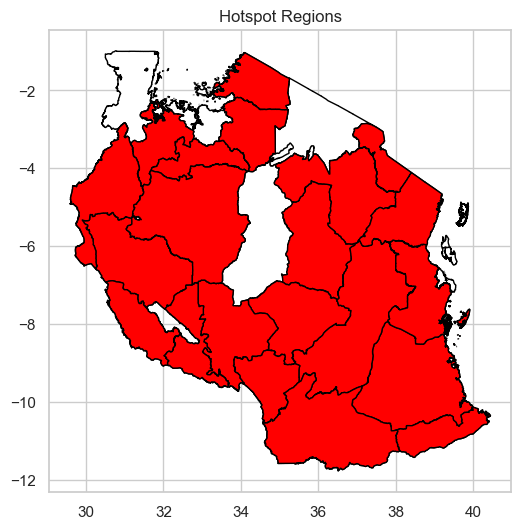

In [47]:
def calculate_trends(df, region_column, year_column, weather_columns):
    """
    Calculate linear trends (slope, intercept, p-value, r-squared) for the specified
    weather_columns over time for each region.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The DataFrame containing your climate/weather data.
    region_column : str
        The name of the column identifying different regions.
    year_column : str
        The name of the column containing the year information.
    weather_columns : list of str
        The list of weather-related columns for which trends should be calculated.
        
    Returns:
    --------
    pandas.DataFrame
        A DataFrame with one row per region per weather column, containing:
        [region_column, 'variable', 'slope', 'intercept', 'p_value', 'r_squared'].
    """
    # Ensure we drop rows that have missing data in any of the required columns
    df = df.dropna(subset=[region_column, year_column] + weather_columns)
    
    results = []
    
    # Group by the specified region column
    for region, group in df.groupby(region_column):
        
        # For each weather variable, fit a separate linear model
        for col in weather_columns:
            X = group[year_column].values
            y = group[col].values
            
            # Skip if there's not enough data
            if len(X) < 2:
                continue
            
            # Add a constant term for the intercept in the OLS model
            X = sm.add_constant(X)
            
            # Fit the model
            model = sm.OLS(y, X).fit()
            
            # Extract regression metrics
            intercept = model.params[0]
            slope     = model.params[1]
            p_value   = model.pvalues[1]  # p-value for slope
            r_squared = model.rsquared
            
            results.append({
                region_column: region,
                "variable": col,
                "slope": slope,
                "intercept": intercept,
                "p_value": p_value,
                "r_squared": r_squared
            })
            
    # Convert the results list to a DataFrame
    results_df = pd.DataFrame(results)
    
    return results_df

# Calculate trends for temperature and precipitation
trend_columns = ['AVG_TEMP_C', 'PRECIPITATION_MM']
trend_results = calculate_trends(tz_climate, 'REGION_NAME', 'YEAR', trend_columns)

# TODO: Define criteria for climate change hotspots
# Hint: Consider temperature trends, precipitation changes, extreme weather events, etc.

# TODO: Implement a function to identify hotspots based on your criteria
def identify_hotspots(trend_df, region_column, variable_column,
                      slope_thresholds=None, p_value_max=0.05):
    """
    Identify hotspots based on slope and p-value criteria in the trends DataFrame.
    
    Parameters:
    -----------
    trend_df : pd.DataFrame
        The result of calculate_trends, containing at least:
        [region_column, variable_column, 'slope', 'p_value']
    region_column : str
        Name of the column identifying each region (e.g., 'Region').
    variable_column : str
        Name of the column identifying which weather variable (e.g., 'variable').
    slope_thresholds : dict or None
        A dictionary mapping variable -> slope threshold for a "hotspot."
        For example: {"Temperature": 0.02, "Precipitation": -0.01}
        means: "Temperature" is a hotspot if slope > 0.02,
               "Precipitation" is a hotspot if slope < -0.01 (adjust logic below).
        If None, no slope-based filtering is applied.
    p_value_max : float
        Maximum p-value for significance.
    
    Returns:
    --------
    pd.DataFrame
        A filtered DataFrame of only the hotspot rows.
    """
    # Start by filtering out any rows whose p-value is > p_value_max
    hotspot_df = trend_df[trend_df["p_value"] <= p_value_max].copy()
    
    if slope_thresholds is not None:
        # We will apply variable-specific slope filters
        mask_list = []
        for var_name, slope_threshold in slope_thresholds.items():
            # Example: for Temperature, we might do slope >= slope_threshold
            # for Precipitation, you might want slope <= slope_threshold, etc.
            # Adjust the logic to match your definition of a "hotspot."
            
            if slope_threshold >= 0:
                # If threshold is positive, we keep rows where slope >= threshold
                var_mask = (
                    (hotspot_df[variable_column] == var_name) &
                    (hotspot_df["slope"] >= slope_threshold)
                )
            else:
                # If threshold is negative, we keep rows where slope <= threshold
                var_mask = (
                    (hotspot_df[variable_column] == var_name) &
                    (hotspot_df["slope"] <= slope_threshold)
                )
            
            mask_list.append(var_mask)
        
        # Combine all masks into a single boolean filter
        combined_mask = mask_list[0]
        for additional_mask in mask_list[1:]:
            # If you want a region to be a hotspot if *any* variable meets its threshold,
            # use OR logic. If you want *all* variables to meet their thresholds, use AND.
            combined_mask = combined_mask | additional_mask
        
        hotspot_df = hotspot_df[combined_mask]
    
    return hotspot_df

hotspots = identify_hotspots(trend_results,'REGION_NAME','variable',slope_thresholds={"AVG_TEMP_C": 0.04, "PRECIPITATION_MM": -3.00},p_value_max=0.05)
# Display the identified hotspots   
print((hotspots.sort_values(by='slope',ascending=False)))

# TODO: Visualize the identified hotspots
hotspot_regions=hotspots[["REGION_NAME"]].drop_duplicates()
# Merge to get geometry
hotspots_gdf = tz_shapefile.merge(hotspot_regions, left_on="ADM1_EN",right_on="REGION_NAME", how="inner")

base = tz_shapefile.plot(color="white", edgecolor="black", figsize=(10, 6))
hotspots_gdf.plot(ax=base, color="red", edgecolor="black")
plt.title("Hotspot Regions")
plt.show()

### Task 4.3: Regional Climate Variation Analysis
Analyze how climate variables vary across different regions of Tanzania.

  REGION_NAME  AVG_TEMP_C_mean  AVG_TEMP_C_min  AVG_TEMP_C_max  \
0      Arusha        22.330000           19.32           24.95   
1      Dodoma        22.178333           18.77           24.64   
2       Geita        22.882083           19.76           25.60   
3      Iringa        23.940833           20.73           26.41   
4      Kagera        25.272500           22.25           27.83   

   PRECIPITATION_MM_mean  PRECIPITATION_MM_min  PRECIPITATION_MM_max  
0             609.004861                  65.9                2026.8  
1             509.807986                 141.9                1834.5  
2             840.473264                 130.1                2996.3  
3            1093.720139                 238.9                3999.9  
4             768.360069                  52.8                2963.5  


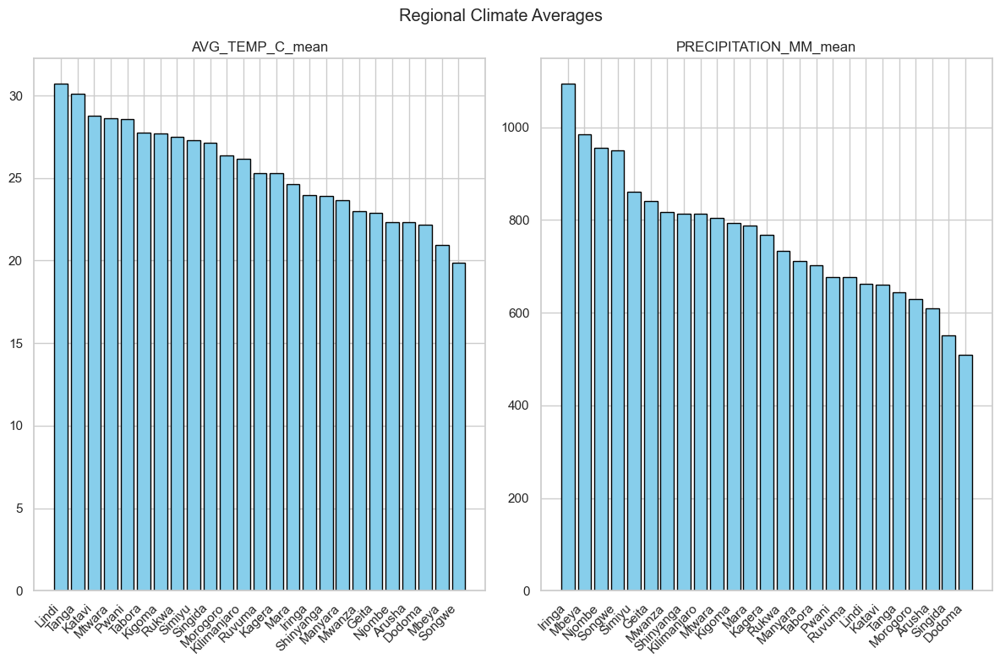

In [54]:
# TODO: Calculate regional statistics for climate variables
def calculate_regional_stats(gdf, region_column, climate_columns):
    """Calculate statistics for climate variables by region.
    
    Parameters:
    gdf (GeoDataFrame): The GeoDataFrame containing climate and spatial data
    region_column (str): The column containing region identifiers
    climate_columns (list): The columns containing climate variables
    
    Returns:
    DataFrame: A DataFrame containing statistics for each region and climate variable
    """
    # TODO: Implement this function
    # Drop rows with missing data in critical columns to avoid errors in groupby calculations
    gdf_clean = gdf.dropna(subset=[region_column] + climate_columns)
    
    # Define which statistics you want to compute
    # You can add or remove stats here (e.g. 'std' for standard deviation)
    agg_dict = {col: ['mean', 'min', 'max'] for col in climate_columns}
    
    # Group by region and compute aggregations
    grouped_stats = gdf_clean.groupby(region_column).agg(agg_dict)
    
    # (Optional) Flatten the MultiIndex columns for easier handling
    # e.g., temperature__mean, temperature__min, temperature__max, etc.
    grouped_stats.columns = [
        f"{col}_{stat}" for col, stat in grouped_stats.columns
    ]
    
    return grouped_stats.reset_index()

regional_stats = calculate_regional_stats(
    gdf=tz_climate, 
    region_column="REGION_NAME",
    climate_columns=["AVG_TEMP_C", "PRECIPITATION_MM"]
)

print(regional_stats.head())

# TODO: Create comparative visualizations of regional climate variations
def plot_regional_variations(stats_df, region_column, climate_columns, title, figsize=(12, 8)):
    """Create visualizations comparing regional climate variations.
    
    Parameters:
    stats_df (DataFrame): The DataFrame containing regional statistics
    region_column (str): The column containing region identifiers
    climate_columns (list): The columns containing climate variables
    title (str): The title of the plot
    figsize (tuple): The figure size
    
    Returns:
    matplotlib.figure.Figure: The created figure
    """
    fig, axes = plt.subplots(
        nrows=1, ncols=len(climate_columns),
        figsize=figsize, 
        sharey=False
    )
    
    if len(climate_columns) == 1:
        axes = [axes]

    for ax, col in zip(axes, climate_columns):
        # Sort by the current column in descending order
        stats_df_sorted = stats_df.sort_values(by=col, ascending=False).reset_index(drop=True)
        
        x_labels = stats_df_sorted[region_column].values
        x_pos = np.arange(len(x_labels))
        y_values = stats_df_sorted[col].values
        
        ax.bar(x_pos, y_values, color='skyblue', edgecolor='black')
        ax.set_title(col)
        ax.set_xticks(x_pos)
        ax.set_xticklabels(x_labels, rotation=45, ha='right')
    
    fig.suptitle(title)
    fig.tight_layout()
    return fig


mean_columns = ["AVG_TEMP_C_mean", "PRECIPITATION_MM_mean"]
variations_plot = plot_regional_variations(
    stats_df=regional_stats,
    region_column="REGION_NAME",
    climate_columns=mean_columns,
    title="Regional Climate Averages"
)
plt.show()

## Conclusion

### Task 5: Summarize Findings
Summarize your key findings from the climate change analysis.

**TODO: Write a summary of your findings here.**

Your summary should include:
1. Key observations about temperature trends
    - Temperatures are on an upward trend
    
2. Identified climate change hotspots
3. Notable regional variations
    - Lindi, Tanga, Katavi, Mtwara and Pwani are the hottest regions on average
    - Tanga, Morogoro, Arusha, Singida and Dodoma are the driest regions on average
4. Potential implications for Tanzania
    - Agricultural extension in the driest regions have to be adapted to low precipitation.
5. Recommendations for further analysis
    - Additional analysis should be done to see the relationship between vegetative biomass and temperatures and rainfall. This could have implications on reforestration efforts